In [ ]:
from spectral import imshow, view_cube
import spectral.io.envi as envi
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import cv2



In [ ]:
dark_ref = envi.open('C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/NIR/Gala/March-July 2021/Week20_07_19_2021/NIR_REF_DARK_07_19_2021.hdr',
                     'C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/NIR/Gala/March-July 2021/Week20_07_19_2021/NIR_REF_DARK_07_19_2021.raw')
#white_ref = envi.open('C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/Millet/NIR_Millet_REF_WHITE_06_2_2021.hdr',
                 #     'C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/Millet/NIR_Millet_REF_WHITE_06_2_2021.raw')
data_ref = envi.open('C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/NIR/Gala/March-July 2021/Week20_07_19_2021/NIR_GC20_10C_SIDE_07_19_2021.hdr',
                     'C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/NIR/Gala/March-July 2021/Week20_07_19_2021/NIR_GC20_10C_SIDE_07_19_2021.raw')




In [ ]:
#white_nparr = np.array(white_ref.load())
dark_nparr = np.array(dark_ref.load())
data_nparr = np.array(data_ref.load())
data_nparr.shape



ImageView object:
  Display bands       :  [0, 128.0, 255]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.0, 170.0]
    G: [169.0, 268.0]
    B: [0.0, 150.0]

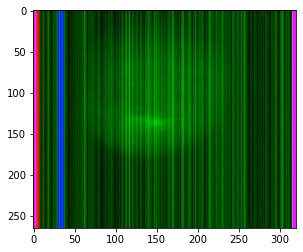

In [15]:
imshow(data_nparr)



In [16]:
#white_nparr = white_nparr[0:310,0:290,:]
dark_nparr = dark_nparr[0:250,0:290,:]
data_nparr = data_nparr[0:250,0:290,:] 



ImageView object:
  Display bands       :  (50, 50, 50)
  Interpolation       :  <default>
  RGB data limits     :
    R: [-0.0470588244497776, 0.3490196168422699]
    G: [-0.0470588244497776, 0.3490196168422699]
    B: [-0.0470588244497776, 0.3490196168422699]

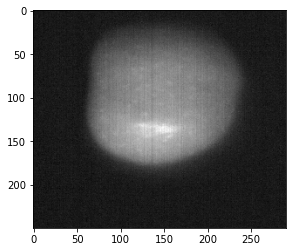

In [17]:
#corrected_nparr = np.divide(np.subtract(data_nparr, dark_nparr), np.subtract(white_nparr, dark_nparr))
corrected_nparr = np.subtract(data_nparr, dark_nparr)/255

imshow(corrected_nparr, (50, 50, 50))



(250, 290)

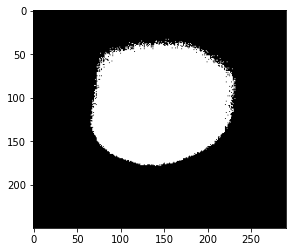

In [19]:
img = corrected_nparr[:,:,50]
mask = img > .09
imshow(mask)
mask.shape



C:\Users\nek222\Anaconda3\lib\site-packages\spectral\graphics\spypylab.py:761: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(**kwargs)


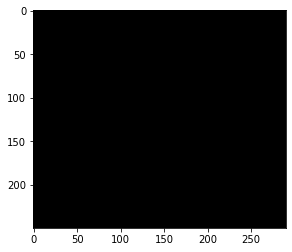

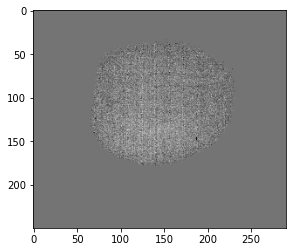

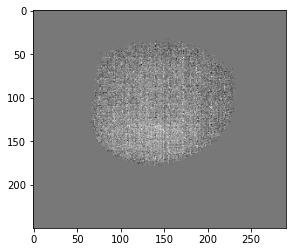

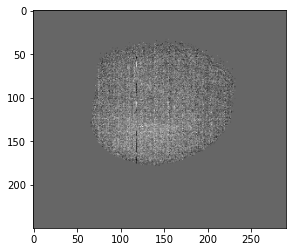

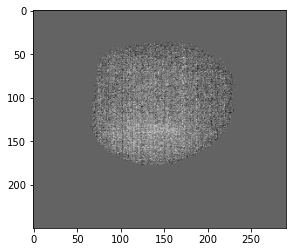

...

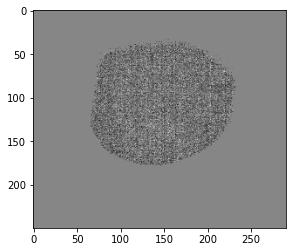

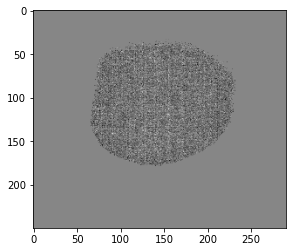

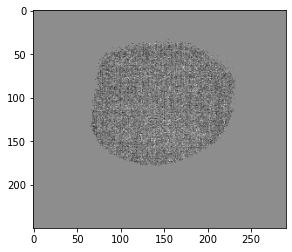

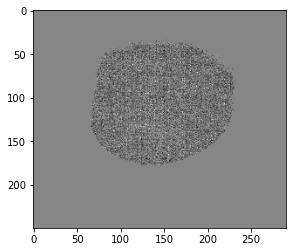

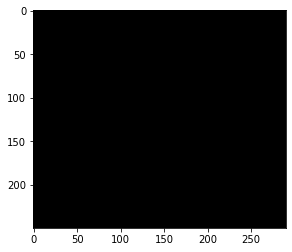

In [20]:
for i in range(256):
 sel = np.zeros_like(corrected_nparr[:,:,i])
 sel[mask] = corrected_nparr[:,:,i][mask]
 imshow(sel)



In [21]:
for i in range(256):
 sel = np.zeros_like(corrected_nparr[:,:,i])
 sel[mask] = corrected_nparr[:,:,i][mask]
 corrected_nparr[:,:,i]=sel



ImageView object:
  Display bands       :  (20, 20, 50)
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.0, 0.2823529541492462]
    G: [0.0, 0.2823529541492462]
    B: [0.0, 0.3490196168422699]

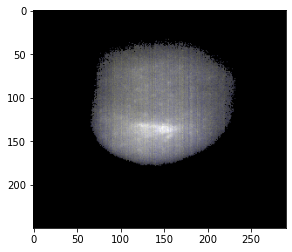

In [22]:
imshow(corrected_nparr, (20, 20, 50))



In [743]:
#bands = np.genfromtxt('C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/Wavelength_Band_NIR.csv', delimiter=',')

#intensity = []

#for b in range(corrected_nparr.shape[2]):
       #  intensity.append(np.mean(corrected_nparr[:, :, b]))
           
#plt.plot(bands, intensity)
#plt.legend(loc='upper left')
#plt.title('Mean Spectral Footprint\n Mean in ROI Area')
#plt.xlabel('Wavelength (nm)')
#plt.ylabel('Reflectance')
#plt.show()



No handles with labels found to put in legend.


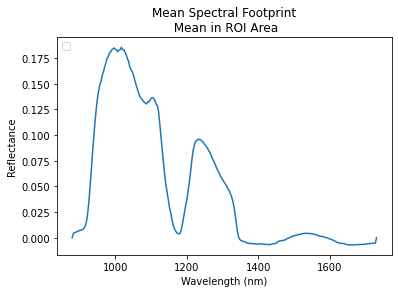

In [23]:
bands = np.genfromtxt('C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/Wavelength_Band_NIR.csv', delimiter=',')
spectra = []
spectrum = []
for j in range(corrected_nparr.shape[0]):
        for k in range(corrected_nparr.shape[1]):
              if corrected_nparr[j,k,50] != 0:
                    a = corrected_nparr[j,k,:]
                    spectrum.append(a)      
             
            
   
   
spectrum = np.array(spectrum)    
 
mean_spectra = np.mean(spectrum, axis=0)

plt.plot(bands, mean_spectra)
plt.legend(loc='upper left')
plt.title('Mean Spectral Footprint\n Mean in ROI Area')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.show()




In [745]:
arr = np.array(mean_spectra)
arr_reshaped = arr[6:247]
arr_reshaped


np.save("C:/Users/nek222/Desktop/PhD UKY/Data analysis/HSI/Mean spectra NIR  Gala SIDE view/NIR_GC20_10C_SIDE_07_19_2021", arr_reshaped)

